In [5]:
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

ModuleNotFoundError: No module named 'seaborn'

In [4]:

# Load the CSV file
df = pd.read_csv('\data\label.csv')
print(df.head())


<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\Mayank Pandey\AppData\Local\Temp\ipykernel_9540\1241246523.py:2: SyntaxWarning: invalid escape sequence '\d'
  df = pd.read_csv('\data\label.csv')
C:\Users\Mayank Pandey\AppData\Local\Temp\ipykernel_9540\1241246523.py:2: SyntaxWarning: invalid escape sequence '\d'
  df = pd.read_csv('\data\label.csv')


NameError: name 'pd' is not defined

In [3]:
# 1. Number of images per class
class_distribution = df['label'].value_counts()
print("Number of images per class:")
print(class_distribution)


# Assuming labels_df['filepath'] contains the full path to the images
image_sizes = []
# Get the list of image files
image_dir = '/kaggle/input/image-dataset/data (1)/data'
image_files = os.listdir(image_dir)

for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    with Image.open(image_path) as img:
        image_sizes.append(img.size)

# Convert to DataFrame for easier analysis
image_sizes_df = pd.DataFrame(image_sizes, columns=['width', 'height'])

# Summary statistics for image sizes
summary_stats = image_sizes_df.describe()
print(summary_stats)

Number of images per class:
label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64
              width        height
count  12601.000000  12601.000000
mean     260.379652    196.574399
std       39.917997     35.280124
min       84.000000     84.000000
25%      254.000000    181.000000
50%      275.000000    183.000000
75%      276.000000    194.000000
max      478.000000    318.000000


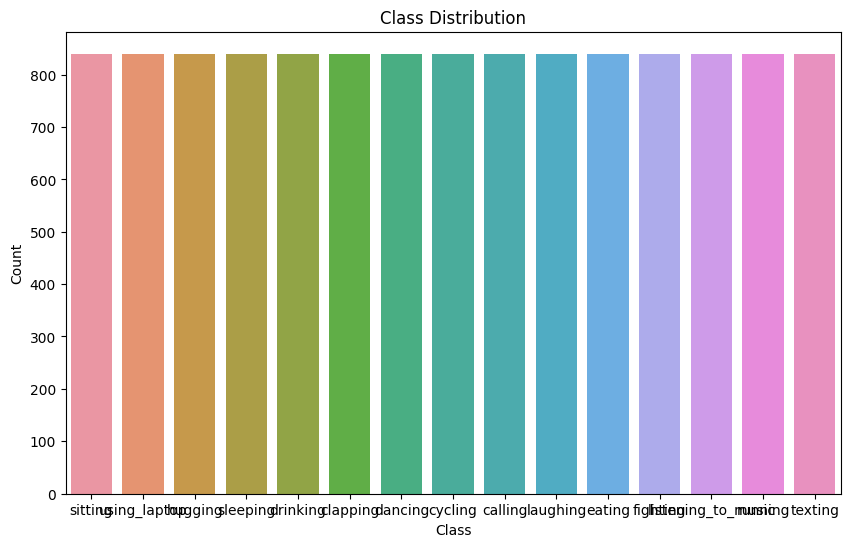

In [19]:
# Plotting the distribution of classes
plt.figure(figsize=(10, 6))
sns.countplot(x=df['label'])
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


In [25]:
df = pd.read_csv('/kaggle/input/image-dataset/data (1)/label.csv')
print(df.columns)

Index(['filename', 'label'], dtype='object')


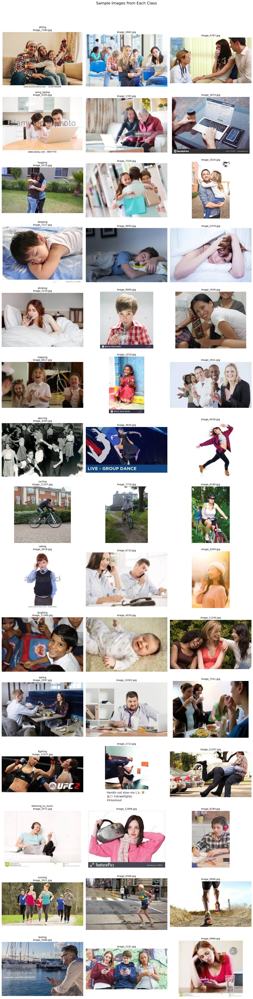

Sample images have been displayed and saved as 'sample_images.png'


In [27]:
import random
from PIL import Image
# Number of sample images to display per class
samples_per_class = 3

# Get unique classes
classes = df['label'].unique()

# Create a figure with subplots
fig, axes = plt.subplots(len(classes), samples_per_class, figsize=(15, 4 * len(classes)))
fig.suptitle("Sample Images from Each Class", fontsize=16)

for i, class_name in enumerate(classes):
    # Get all filenames for this class
    class_files = df[df['label'] == class_name]['filename'].tolist()

    # Randomly select sample images
    sample_files = random.sample(class_files, min(samples_per_class, len(class_files)))

    for j, filename in enumerate(sample_files):
        image_path = os.path.join(image_dir, filename)

        try:
            img = Image.open(image_path)
            axes[i, j].imshow(img)
            axes[i, j].axis('off')

            if j == 0:
                axes[i, j].set_title(f"{class_name}\n{filename}", fontsize=10)
            else:
                axes[i, j].set_title(filename, fontsize=10)

        except Exception as e:
            print(f"Error loading image {filename}: {str(e)}")
            axes[i, j].text(0.5, 0.5, f"Error loading\n{filename}", ha='center', va='center')
            axes[i, j].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.savefig('sample_images.png', dpi=300, bbox_inches='tight')
plt.show()

print("Sample images have been displayed and saved as 'sample_images.png'")

**PART B**

In [15]:
import cv2
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif

def extract_hog_features(image, orientations=9, pixels_per_cell=(16, 16), cells_per_block=(2, 2)):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hog = cv2.HOGDescriptor(_winSize=(gray.shape[1] // cells_per_block[1] * cells_per_block[1],
                                      gray.shape[0] // cells_per_block[0] * cells_per_block[0]),
                            _blockSize=(cells_per_block[1] * pixels_per_cell[1],
                                        cells_per_block[0] * pixels_per_cell[0]),
                            _blockStride=(pixels_per_cell[1], pixels_per_cell[0]),
                            _cellSize=(pixels_per_cell[1], pixels_per_cell[0]),
                            _nbins=orientations)
    
    hog_features = hog.compute(gray)
    return hog_features.flatten()

def extract_color_histogram(image, bins=32):
    hist = cv2.calcHist([image], [0, 1, 2], None, [bins, bins, bins], [0, 256, 0, 256, 0, 256])
    return hist.flatten() / np.sum(hist)

def extract_gabor_features(image, num_filters=8):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_features = []
    
    for theta in range(0, 180, 180 // num_filters):
        theta = theta * np.pi / 180  # convert to radians
        kern = cv2.getGaborKernel((31, 31), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        fimg = cv2.filter2D(gray, cv2.CV_8UC3, kern)
        gabor_features.append(np.mean(fimg))
        gabor_features.append(np.std(fimg))
    
    return np.array(gabor_features)

def extract_features(image_path):
    try:
        img = cv2.imread(image_path)
        if img is None:
            raise Exception("Image could not be read")
        
        img = cv2.resize(img, (128, 256))  # Increased resolution
        
        hog_features = extract_hog_features(img)
        color_hist = extract_color_histogram(img)
        gabor_features = extract_gabor_features(img)
        
        return np.concatenate((hog_features, color_hist, gabor_features))
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None

# Load the dataset
df = pd.read_csv('/kaggle/input/image-dataset/data (1)/label.csv')
image_dir = '/kaggle/input/image-dataset/data (1)/data'

# Extract features
features = []
labels = []

for idx, row in tqdm(df.iterrows(), total=len(df), desc="Extracting features"):
    image_path = os.path.join(image_dir, row['filename'])
    feature_vector = extract_features(image_path)
    if feature_vector is not None:
        features.append(feature_vector)
        labels.append(row['label'])

# Convert to numpy arrays
X = np.array(features)
y = np.array(labels)

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Feature selection
selector = SelectKBest(f_classif, k=8000)  # Select top 6000 features
X_selected = selector.fit_transform(X_scaled, y)

# Create a new dataframe with selected features
feature_df = pd.DataFrame(X_selected)
feature_df['label'] = y

# Save features to CSV
feature_df.to_csv('image_features_optimized.csv', index=False)

print("Feature extraction and optimization completed.")
print(f"Number of images processed: {len(feature_df)}")
print(f"Number of features per image: {X_selected.shape[1]}")
print("Features saved to 'image_features_optimized.csv'")

# Display some statistics
print("\nFeature Statistics:")
print(feature_df.describe())

print("\nClass Distribution in Processed Images:")
print(feature_df['label'].value_counts(normalize=True) * 100)

Extracting features: 100%|██████████| 12600/12600 [03:13<00:00, 65.23it/s]
/opt/conda/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 4583  4584  4585 ... 35894 35895 35925] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/opt/conda/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


Feature extraction and optimization completed.
Number of images processed: 12600
Number of features per image: 8000
Features saved to 'image_features_optimized.csv'

Feature Statistics:
               0             1             2             3             4     \
count  1.260000e+04  1.260000e+04  1.260000e+04  1.260000e+04  1.260000e+04   
mean  -1.150403e-16 -3.609106e-17  4.849736e-17  3.891067e-17 -7.923115e-17   
std    1.000040e+00  1.000040e+00  1.000040e+00  1.000040e+00  1.000040e+00   
min   -2.019146e+00 -1.225743e+00 -1.067507e+00 -8.411054e-01 -9.695404e-01   
25%   -6.879944e-01 -8.546519e-01 -7.868551e-01 -7.495306e-01 -7.607932e-01   
50%    2.407703e-01 -1.995601e-01 -2.692101e-01 -3.518847e-01 -3.520130e-01   
75%    7.615681e-01  6.391804e-01  4.992341e-01  3.877179e-01  4.452145e-01   
max    3.900670e+00  4.192956e+00  5.202745e+00  6.235155e+00  5.605646e+00   

               5             6             7             8             9     \
count  1.260000e+04  1.

**PART C**

In [17]:
print(feature_df.columns)

Index([      0,       1,       2,       3,       4,       5,       6,       7,
             8,       9,
       ...
          7991,    7992,    7993,    7994,    7995,    7996,    7997,    7998,
          7999, 'label'],
      dtype='object', length=8001)


**PART C**

In [18]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Load the prepared dataset
df = pd.read_csv('/kaggle/working/image_features_optimized.csv')

# Separate features and labels
X = df.drop([ 'label'], axis=1)
y = df['label']

# Encode labels
le = LabelEncoder()
y = le.fit_transform(y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Perceptron': Perceptron(random_state=42)
}

# Train and evaluate models
results = {}

for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = accuracy
    
    print(f"{name} Accuracy: {accuracy:.4f}")
    print()

# Compare model performances
print("Model Performance Comparison:")
for name, accuracy in results.items():
    print(f"{name}: {accuracy:.4f}")

# Find the best performing model
best_model = max(results, key=results.get)
print(f"\nBest performing model: {best_model} with accuracy {results[best_model]:.4f}")



Training Naive Bayes...
Naive Bayes Accuracy: 0.1627

Training Decision Tree...
Decision Tree Accuracy: 0.1627

Training Random Forest...
Random Forest Accuracy: 0.3282

Training Perceptron...
Perceptron Accuracy: 0.2345

Model Performance Comparison:
Naive Bayes: 0.1627
Decision Tree: 0.1627
Random Forest: 0.3282
Perceptron: 0.2345

Best performing model: Random Forest with accuracy 0.3282


**PART D**

In [28]:
# Save all trained models
import pickle

# Create a directory for the models if it doesn't exist
import os
if not os.path.exists('saved_models'):
    os.makedirs('saved_models')

# Save each model
for name, model in models.items():
    filename = f'saved_models/{name.lower()}_model.pkl'
    with open(filename, 'wb') as f:
        pickle.dump(model, f)
    print(f"Saved {name} model to {filename}")

# Save the label encoder
with open('saved_models/label_encoder.pkl', 'wb') as f:
    pickle.dump(le, f)
print("Saved label encoder")

# Save model results for reference
results_dict = {
    'model_accuracies': results,
    'best_model': best_model,
    'best_accuracy': results[best_model]
}

with open('saved_models/model_results.pkl', 'wb') as f:
    pickle.dump(results_dict, f)
print("Saved model results")

Saved Naive Bayes model to saved_models/naive bayes_model.pkl
Saved Decision Tree model to saved_models/decision tree_model.pkl
Saved Random Forest model to saved_models/random forest_model.pkl
Saved Perceptron model to saved_models/perceptron_model.pkl
Saved label encoder
Saved model results


In [1]:
# Load and verify models
loaded_models = {}
for name in models.keys():
    filename = f'Saved_models/{name.lower()}_model.pkl'
    with open(filename, 'rb') as f:
        loaded_models[name] = pickle.load(f)
    
    # Verify model by making predictions on test set
    loaded_accuracy = accuracy_score(y_test, loaded_models[name].predict(X_test))
    print(f"\nLoaded {name} model accuracy: {loaded_accuracy:.4f}")
    print(f"Original {name} model accuracy: {results[name]:.4f}")

NameError: name 'models' is not defined

In [4]:
import sklearn

ModuleNotFoundError: No module named 'sklearn'

In [2]:
import pickle
import os

# Directory for saved models
model_dir = 'saved_models'

# Load the results dictionary
with open(os.path.join(model_dir, 'model_results.pkl'), 'rb') as f:
    results_dict = pickle.load(f)

# Load the models
models = {}
for filename in os.listdir(model_dir):
    if filename.endswith('_model.pkl'):
        model_name = filename.split('_model.pkl')[0].capitalize()
        with open(os.path.join(model_dir, filename), 'rb') as f:
            models[model_name] = pickle.load(f)

# Load the label encoder
with open(os.path.join(model_dir, 'label_encoder.pkl'), 'rb') as f:
    le = pickle.load(f)

# Print saved accuracies for each model
print("Model Accuracies:")
for model_name, accuracy in results_dict['model_accuracies'].items():
    print(f"{model_name}: {accuracy * 100:.2f}%")

# Print the best model and its accuracy
print(f"\nBest Model: {results_dict['best_model']} with an accuracy of {results_dict['best_accuracy'] * 100:.2f}%")


ModuleNotFoundError: No module named 'sklearn'